In [ ]:
# for this project i installed drawbot in a virtual environment
# otherwise install via command line using:
# pip install git+https://github.com/typemytype/drawbot

In [112]:
import drawBot as db
from IPython.display import Image, display, IFrame
from PIL import Image as PILImage, ImageFilter as PILImageFilter
import os
import csv
import random

In [ ]:
# get list of font names
fonts_list = db.installedFonts()
for font in fonts_list:
    print(font)

AcademyEngravedLetPlain
AkzidenzGroteskPro-Bold
AkzidenzGroteskPro-BoldCn
AkzidenzGroteskPro-BoldCnIt
AkzidenzGroteskPro-BoldEx
AkzidenzGroteskPro-BoldExIt
AkzidenzGroteskPro-BoldIt
AkzidenzGroteskPro-Cn
AkzidenzGroteskPro-Ext
AkzidenzGroteskPro-ExtItalic
AkzidenzGroteskPro-It
AkzidenzGroteskPro-LigExtIt
AkzidenzGroteskPro-Light
AkzidenzGroteskPro-LightCn
AkzidenzGroteskPro-LightEx
AkzidenzGroteskPro-LightIt
AkzidenzGroteskPro-Md
AkzidenzGroteskPro-MdCn
AkzidenzGroteskPro-MdCnIt
AkzidenzGroteskPro-MdEx
AkzidenzGroteskPro-MedExtIt
AkzidenzGroteskPro-Regular
AkzidenzGroteskPro-Super
AkzidenzGroteskPro-SuperItalic
AkzidenzGroteskPro-XBd
AkzidenzGroteskPro-XBdCn
AkzidenzGroteskPro-XBdCnIt
AkzidenzGroteskPro-XBdIt
AlBayan
AlBayan-Bold
AlNile
AlNile-Bold
AlTarikh
Alejandro
AmericanTypewriter
AmericanTypewriter-Bold
AmericanTypewriter-Condensed
AmericanTypewriter-CondensedBold
AmericanTypewriter-CondensedLight
AmericanTypewriter-Light
AmericanTypewriter-Semibold
AndaleMono
Apple-Chancery
Appl

In [126]:
# get generated text
csv_path = "unique_text_to_post.csv"

# read into a list
with open(csv_path, newline='', encoding='utf-8') as csvfile:
    reader = csv.reader(csvfile)
    #skip header
    next(reader)
    entries = [row[0] for row in reader if row]

text_obj = random.choice(entries)
print(f'random string: {text_obj}')

random string: Single guys are so eager to have their cake and eat it, they're ready for the other side.


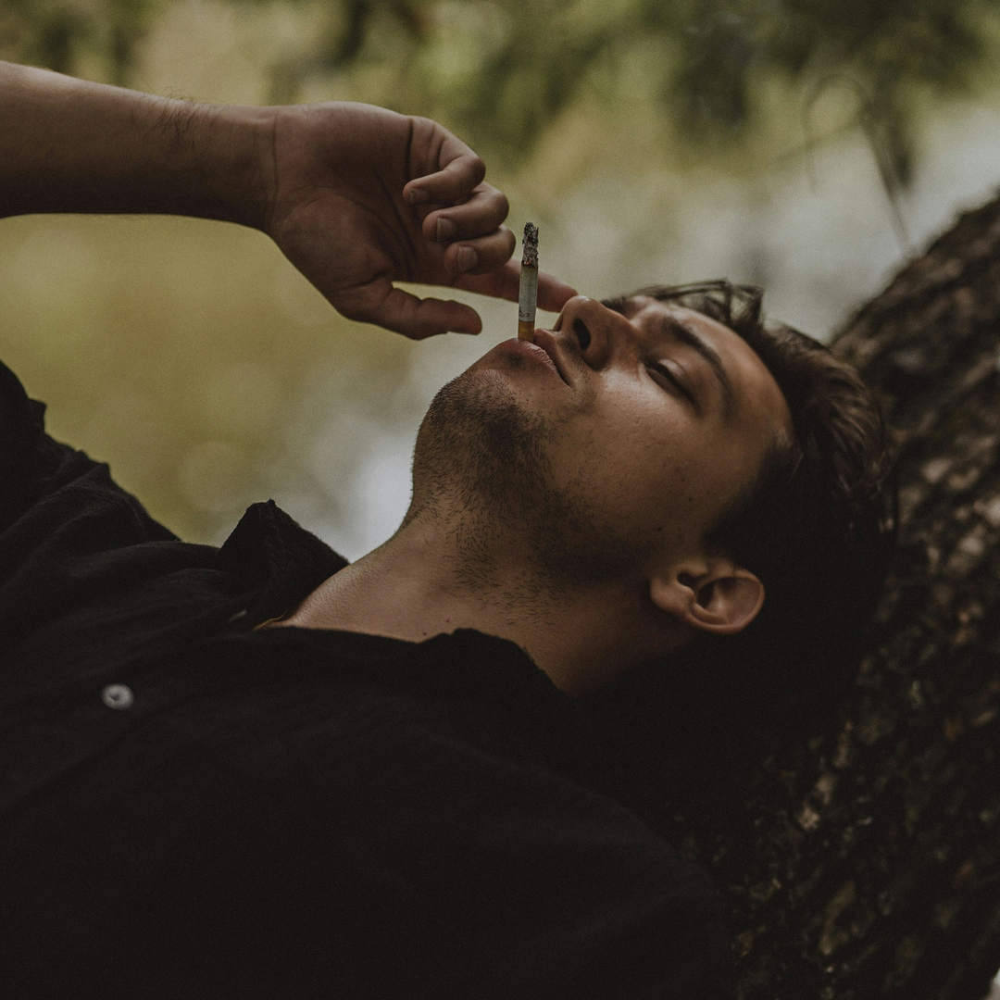

In [ ]:
# photo setup

# source image path
img_source = 'random_unsplash_image.jpg'

# variables for output image
# ideal instagram sizes for posts
# square              1080 x 1080
# 4:5 (vertical)      1080 x 1350
# 1.91:1 (landscape)  1080 x 566
output_png = "test.png"
output_x, output_y = 1080, 1080

# calculate height needed to maintain aspect ratio
imgPIL = PILImage.open(img_source)
w_percent = output_x / float(imgPIL.width)
target_height = int(float(imgPIL.height) * w_percent)

# resize image to be smaller
img_resized = imgPIL.resize((output_x, target_height), PILImage.LANCZOS)

# crop to center
top = (target_height - output_y) // 2
bottom = top + output_y
# crop arguments: left, top, right, bottom
img_cropped = img_resized.crop((0, top, output_x, bottom))

display(img_cropped)

# save to a temporary file to use with db.imagePixelColor() below
temp_path = 'temp_img.png'
img_cropped.save(temp_path)

# prepare blurred image for later (overlay to help text legibility)
img_blurred = img_cropped.filter(PILImageFilter.GaussianBlur(radius=10))
temp_path_blurred = 'temp_img_blurred.png'
img_blurred.save(temp_path_blurred)

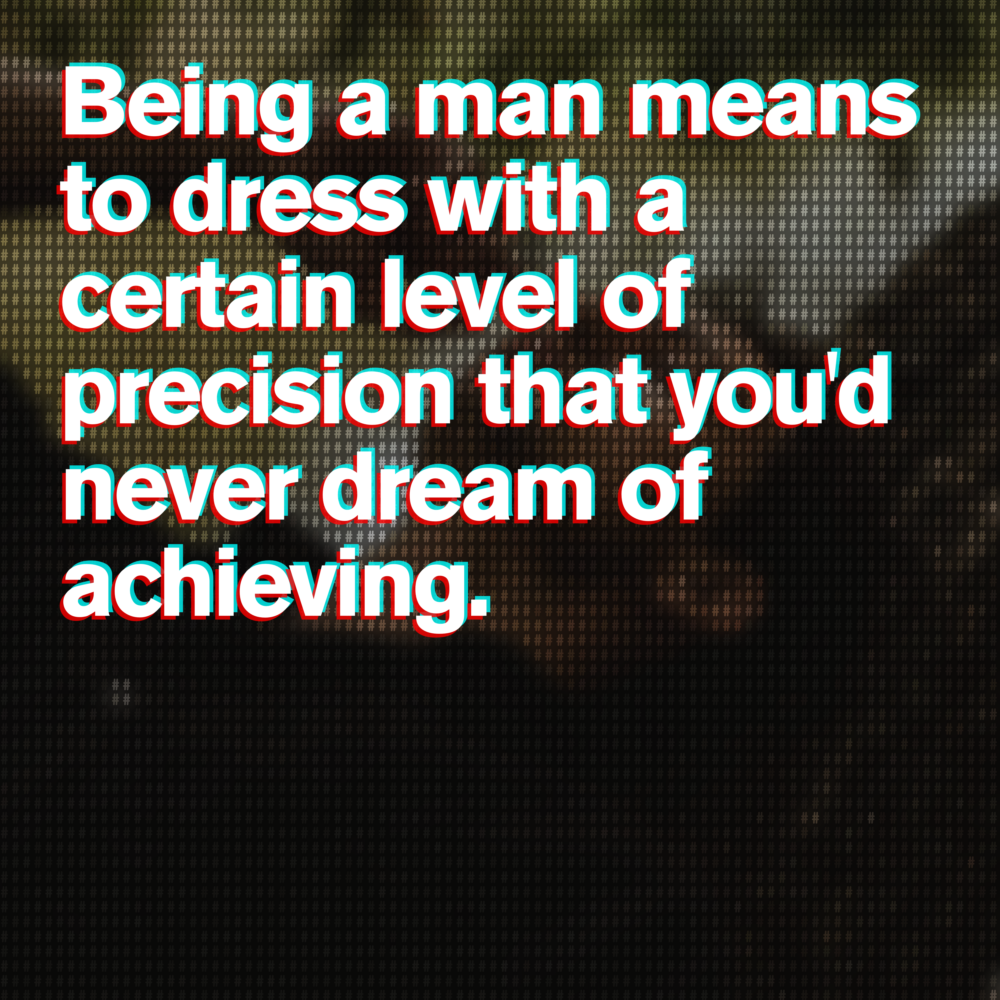

In [125]:
# wrapper for drawing instructions
with db.drawing():    
    # define canvas size
    db.newPage(output_x, output_y)

    # set background colour
    db.fill(0, 0, 0)
    #db.fill(db.random(), db.random(), db.random())
    db.rect(0, 0, db.width(), db.height())

    # ASCII art effect
    pixel_size = 16
    db.font('CourierNewPS-BoldMT')
    #db.font('CourierNewPSMT')
    db.fontSize(pixel_size)

    for x in range(0, output_x, 12):
        for y in range(0, output_y, pixel_size):
            color = db.imagePixelColor(temp_path, (x, y))
            if color:
                r, g, b, a = color
                db.fill(r, g, b, a)
                db.text("#", (x, y))

    # add blurred image
    blurred_img_obj = db.ImageObject()
    with blurred_img_obj:
        db.newPage(output_x, output_y)
        db.image(temp_path_blurred, (0, 0))
    db.image(blurred_img_obj, (0, 0), 0.5)

    # add text
    
    # test strings of different lengths
    #text_obj = 'Masculinity is not simply the physical and emotional dominance of a man it is also the physical and emotional vulnerability and dignity of a woman.'
    #text_obj = 'A manly man'

    bx, by, bw, bh = 64, 64, 960, 960
    db.fill(0, 0, 0, 0)
    db.rect(bx, by, bw, bh)

    db.font('AkzidenzGroteskPro-Bold')
    db.fontSize(104)
    db.lineHeight(104)
    db.tracking(-4)

    chrom = 4

    # teal (r, g, b, alpha)
    db.fill(0, 255, 255, 0.8)
    db.textBox(text_obj, (bx+chrom, by+chrom, bw, bh))

    # red (r, g, b, alpha)
    db.fill(255, 0, 0, 0.8)
    db.textBox(text_obj, (bx-chrom, by-chrom, bw, bh))

    # # random colour
    # db.fill(db.random(), db.random(), db.random(), 0.5)
    # db.textBox(text_obj, (bx+chrom, by+chrom, bw, bh))

    # # random colour
    # db.fill(db.random(), db.random(), db.random(), 0.5)
    # db.textBox(text_obj, (bx-chrom, by-chrom, bw, bh))

    # white
    db.fill(255, 255, 255)
    db.textBox(text_obj, (bx, by, bw, bh))
    
    db.saveImage(output_png, imageResolution=300)
    display(Image(output_png))


# os.remove(temp_path) 